#### Requirements: python3.5, MiKTex2.9

## 2.0 Imports

In [4]:
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import NMF
from time import time

Dataset consists of 400 faces, each face has 10304 features.


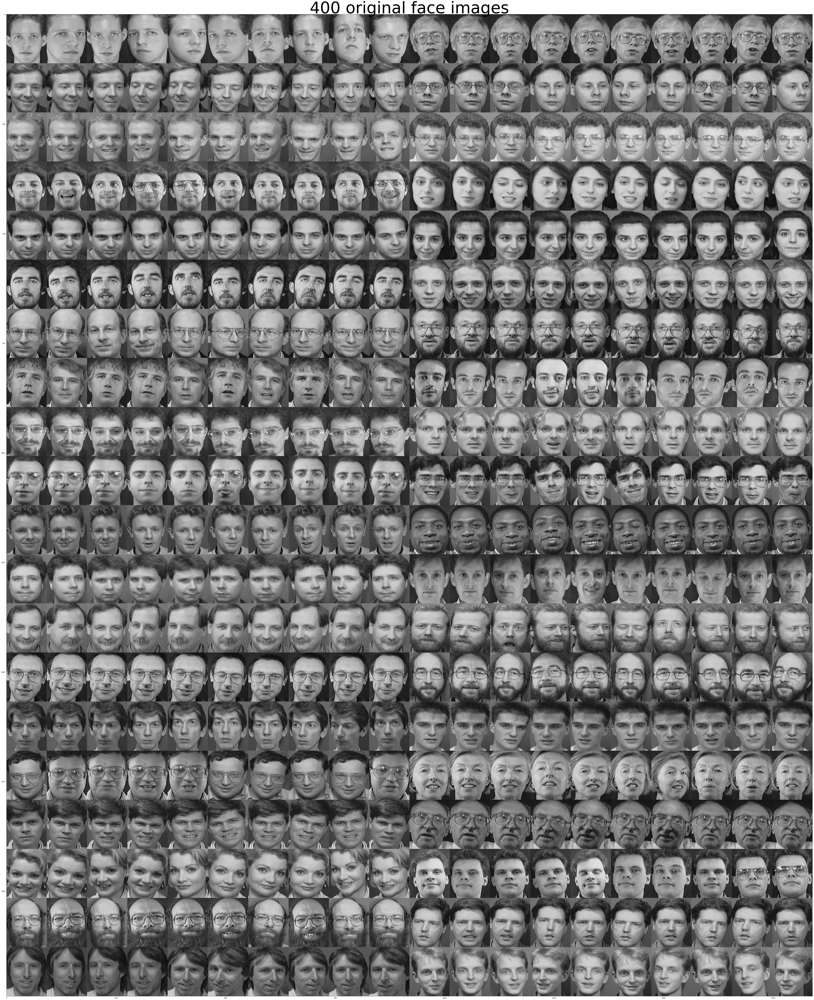

In [80]:
# This will load the matrix V
V = loadmat('attfaces.mat')['V']
print ("Dataset consists of %d faces, each face has %d features." % (V.shape[1], V.shape[0]) )
plot_gallery('400 original face images',  V )

## Visualisation tool

In [106]:
# visualisation
def plot_gallery(title, vect, fsize=[92,112]):

    height = 112
    width = 92

    numVisualize = int(np.sqrt(vect.shape[1])) #must be a square
    V_visual = np.zeros([height*numVisualize, width*numVisualize])
    
    ix = 0
    ix1 = 0
    for i in range(numVisualize):
        ix2 = 0
        for j in range(numVisualize):
            curV = vect[:,ix]
            curV = np.reshape(np.uint8(curV),[height, width],order='F')
            V_visual[ix1:(ix1+height), ix2:(ix2+width)] = curV
            ix2 = ix2 + width
            ix = ix+1
        ix1 = ix1 + height

    plt.figure(figsize=fsize)
    plt.title(title, size=fsize[1], usetex=False)
    plt.imshow(V_visual,cmap=plt.cm.gray,vmax=np.max(vect), vmin=np.min(vect))
    plt.show()

## 2.1 Implement the EM for NMF

In [79]:
# EM algorithm for NMF
def NMF_EM(V, W0, H0, alpha_w=1, beta_w=1, alpha_h=1, beta_h=1):
    W = W0
    H = H0
    V_hat = np.dot(W,H)
    niter = 1
    err = list([np.mean(np.square(V-V_hat))])
    while err[-1]>5e3 and niter<1000:
        W = (W * ( (V / V_hat) .dot(H.T) ) + alpha_w -1) / (np.ones_like(V) .dot(H.T) + beta_w)
        H = (H * ( W.T .dot(V / V_hat) ) + alpha_h -1) / (W.T .dot(np.ones_like(V)) + beta_h)
        V_hat = np.dot(W,H)
        niter = niter + 1
        err.append(np.mean(np.square(V-V_hat)))
#         print(err[-1])
    return W,H,err

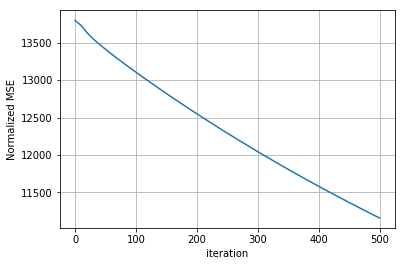

In [71]:
K = 25
F, N = V.shape
W0 = np.random.rand(F,K)
H0 = np.random.rand(K,N)

t0 = time()    
W, H, err = NMF_EM(V, W0, H0 )
train_time = (time() - t0)

print ("NMF EM estimate done in %0.3fs" % train_time)

## Visualize the Normalized MSE with iteration

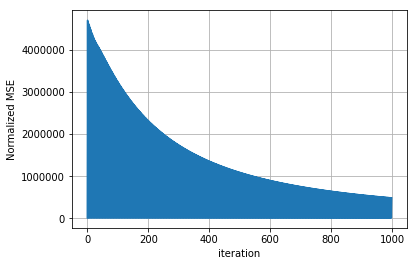

In [74]:
plt.figure()
plt.plot(err)
plt.xlabel('iteration')
plt.ylabel('Normalized MSE')
plt.grid()
plt.show()

## Visualize the eigenfaces

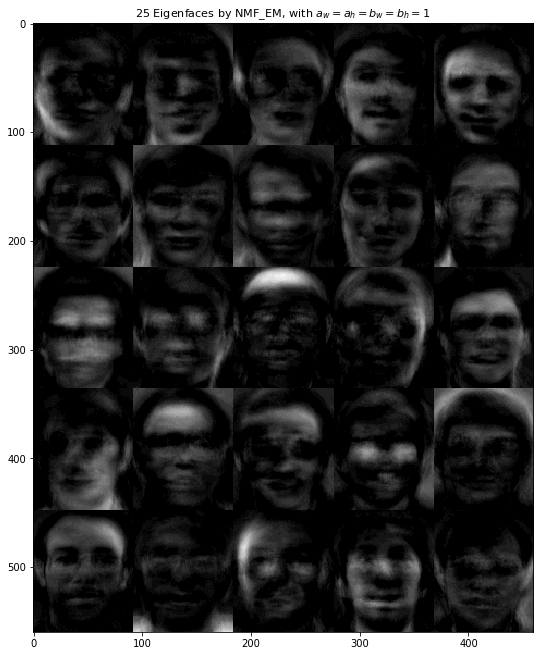

In [107]:
plot_gallery('25 Eigenfaces by NMF_EM, with $a_w=a_h=b_w=b_h=1$',  W, fsize=[92/10,112/10] )

## Compare with NMF provided by sklearn

NMF sklearn training done in 6.871s


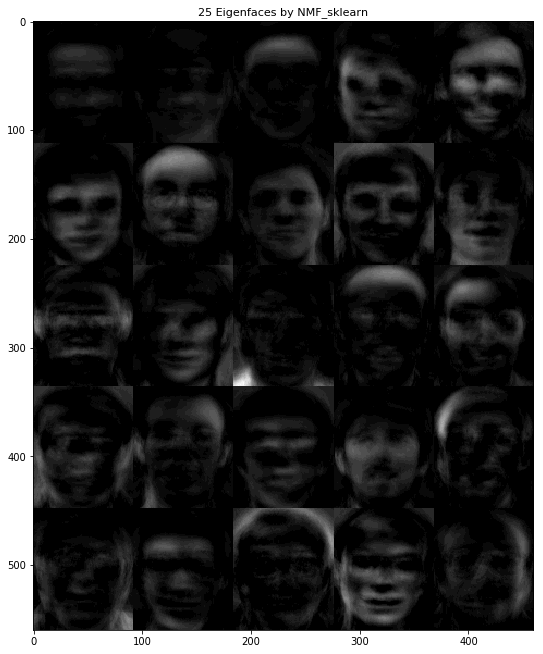

In [134]:
K = 25
nmf_sklearn = NMF(n_components=K, init='random', tol=5e-3)

t0 = time()    
fit_data = nmf_sklearn.fit_transform(np.transpose(V))
train_time = (time() - t0)

print ("NMF sklearn training done in %0.3fs" % train_time)

W = np.transpose(nmf_sklearn.components_)

# plot_gallery('original 400 face images',V)
plot_gallery('25 Eigenfaces by NMF_sklearn', W, fsize=[92/10,112/10] )

In [39]:
from nimfa.methods.seeding.nndsvd import Nndsvd
initializer = Nndsvd()
W0, H0 = initializer.initialize(V, K, options={'flag':1})
W0 = np.array(W0)
H0 = np.array(H0)

## 2.1 Test the role of $\beta$ in the model

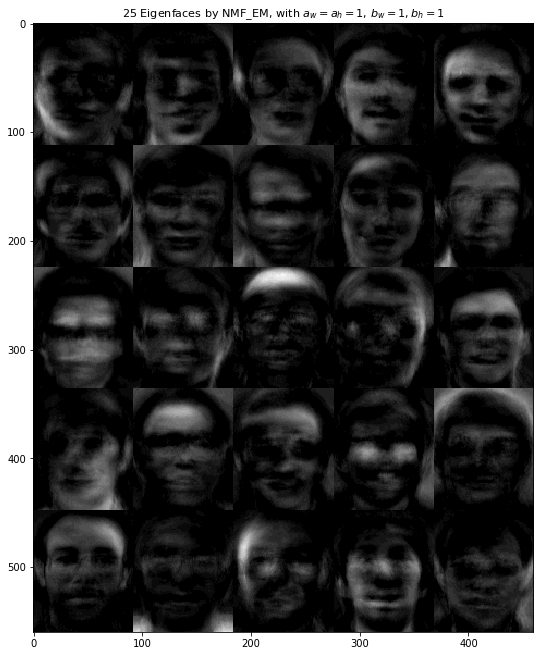

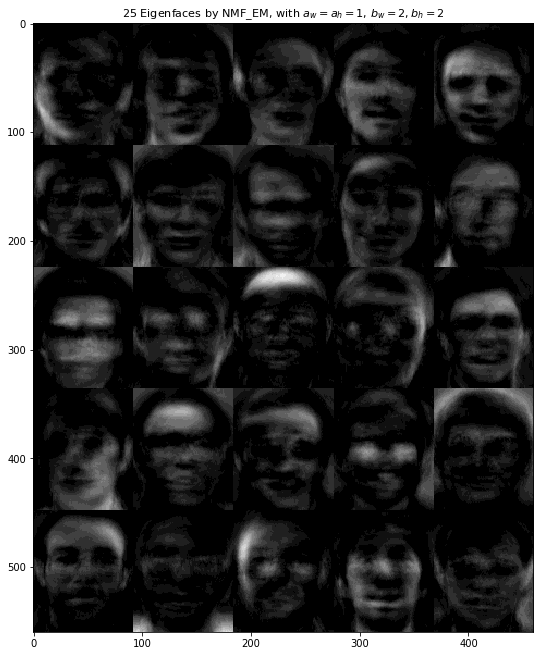

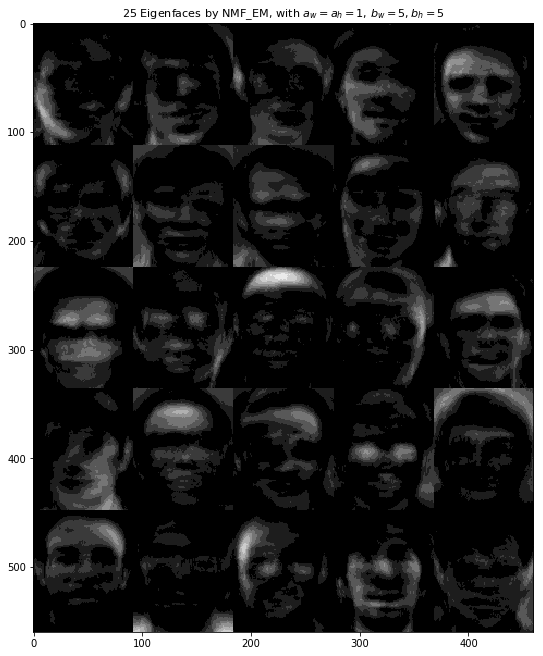

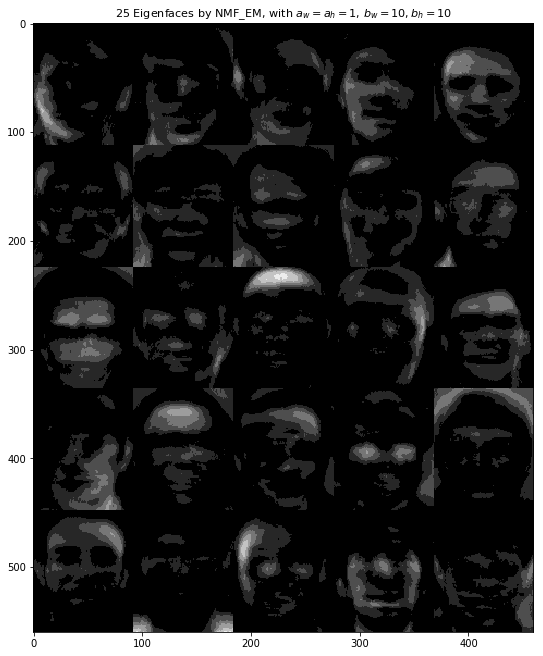

In [108]:
for [beta_w, beta_h] in [[1,1],[2,2],[5,5],[10,10]]:
    W, H, err = NMF_EM(V, W0, H0, beta_w=beta_w, beta_h=beta_h )
    plot_gallery('25 Eigenfaces by NMF_EM, with $a_w=a_h=1$, $b_w=%d,b_h=%d$' %(beta_w,beta_h),  W, fsize=[92/10,112/10] )

Comparing the four plot of eigenfaces, we find that the larger $\beta_w$ and $\beta_h$ are, the more abstrat the eigenfaces will be, which means mathmatically W will be more sparse. This can be explained by the charactistic of Gamma distribution. In the following figure, the pdf of Gamma distribution is shown with fixed parameter $\alpha$ and varying $\beta$. We find the sequence drawn from Gamma distribution becomes more spares when $\beta$ increases.

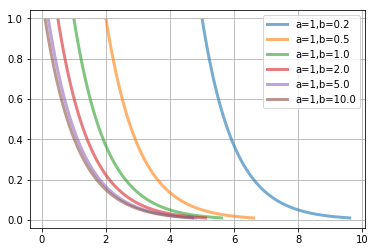

In [126]:
from scipy.stats import gamma
fig, ax = plt.subplots(1, 1)
for [a,scale] in [[1,1/0.2],[1,1/0.5],[1,1/1],[1,1/2],[1,1/5],[1,1/10]]:
    mean, var, skew, kurt = gamma.stats(a, scale, moments='mvsk')
    x = np.linspace(gamma.ppf(0.01, a, scale),gamma.ppf(0.99, a, scale), 100)
    ax.plot(x, gamma.pdf(x, a, scale), lw=3, alpha=0.6, label='a=%1.0f,b=%1.1f'%(a,1/scale))
plt.grid()
plt.legend()
plt.show()

## 2.2 Test the role of $\alpha$ in the model

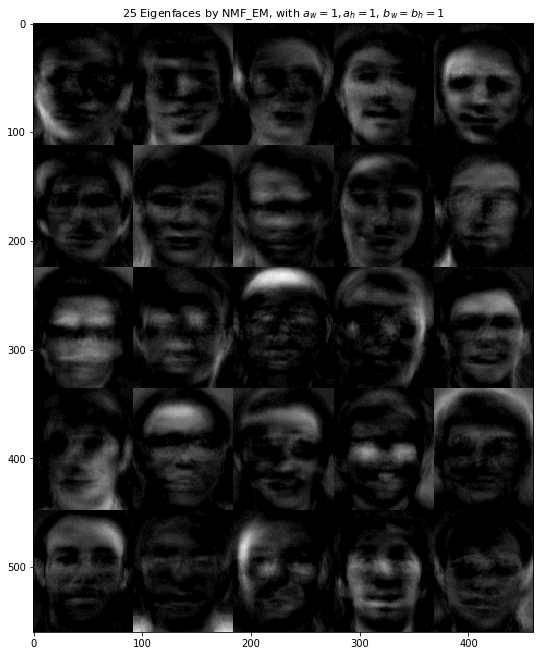

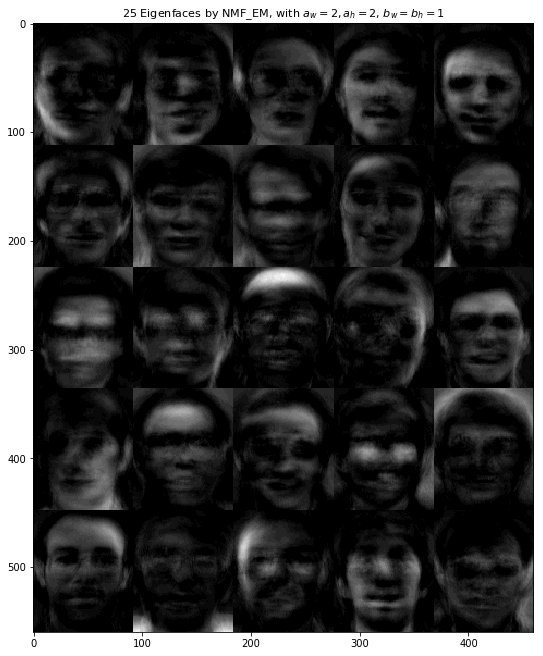

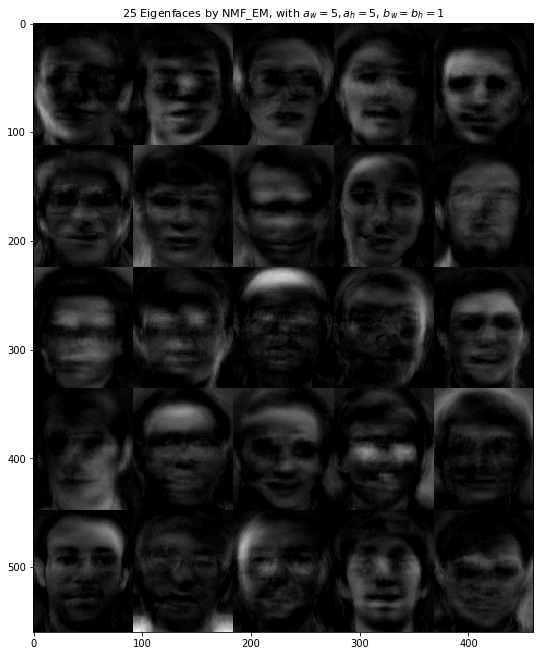

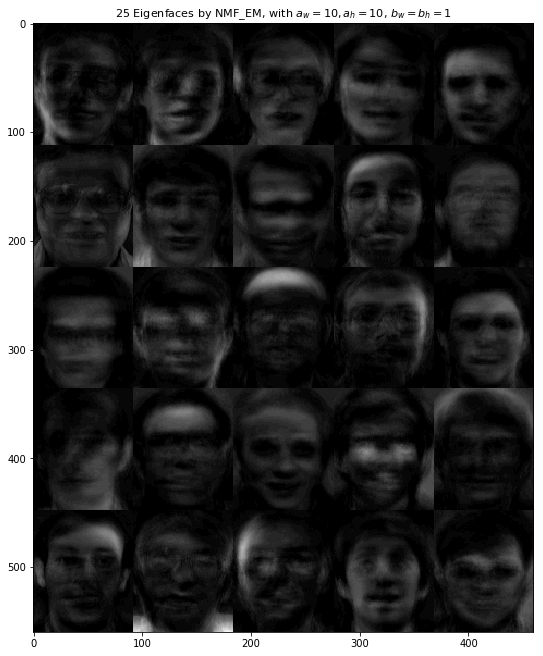

In [132]:
for [alpha_w, alpha_h] in [[1,1],[2,2],[5,5],[10,10]]:
    W, H, err = NMF_EM(V, W0, H0, alpha_w=alpha_w, alpha_h=alpha_h )
    plot_gallery('25 Eigenfaces by NMF_EM, with $a_w=%d,a_h=%d$, $b_w=b_h=1$' %(alpha_w,alpha_h),  W, fsize=[92/10,112/10] )

In contrast to the role of $\alpha$, we find that the smaller $\alpha_w$ and $\alpha_h$ are, the more abstrat the eigenfaces will be, i.e. W will be more sparse. Similarily, we show the pdf of Gamma distribution with fixed parameter $\beta$ and varying $\alpha$. We find the sequence drawn from Gamma distribution becomes more sparse when $\alpha$ decreases.

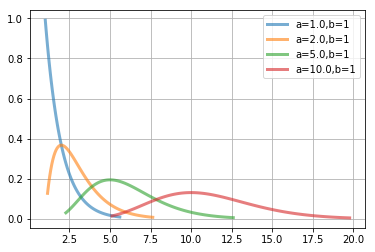

In [139]:
from scipy.stats import gamma
fig, ax = plt.subplots(1, 1)
for [a,scale] in [[1,1],[2,1],[5,1],[10,1]]:
    mean, var, skew, kurt = gamma.stats(a, scale, moments='mvsk')
    x = np.linspace(gamma.ppf(0.01, a, scale),gamma.ppf(0.99, a, scale), 100)
    ax.plot(x, gamma.pdf(x, a, scale), lw=3, alpha=0.6, label='a=%1.1f,b=%1.0f'%(a,1/scale))
plt.grid()
plt.legend()
plt.show()